# 无标度网络+囚徒困境

In [1]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import time
import numpy as np

# 设置随机数种子
random.seed(10)

plt.style.use("bmh")

# 定义囚徒困境博弈的收益矩阵
T = np.arange(1.0, 2.00, 0.05)  # 诱惑，假设b=1.5
R = 1.0    # 奖励
P = 0.0    # 惩罚
S = 0.0    # 受骗

# 初始化网络
N = 10000  # 节点总数
ms = np.array((2,4,8))      # 每次添加新节点时连接的节点数 m=z/2
Gs = [nx.barabasi_albert_graph(N, m) for m in ms]

for G in Gs:
    print(G)

Graph with 10000 nodes and 19996 edges
Graph with 10000 nodes and 39984 edges
Graph with 10000 nodes and 79936 edges


无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.050, 达到动态平衡用时 1231.4422044754028 s


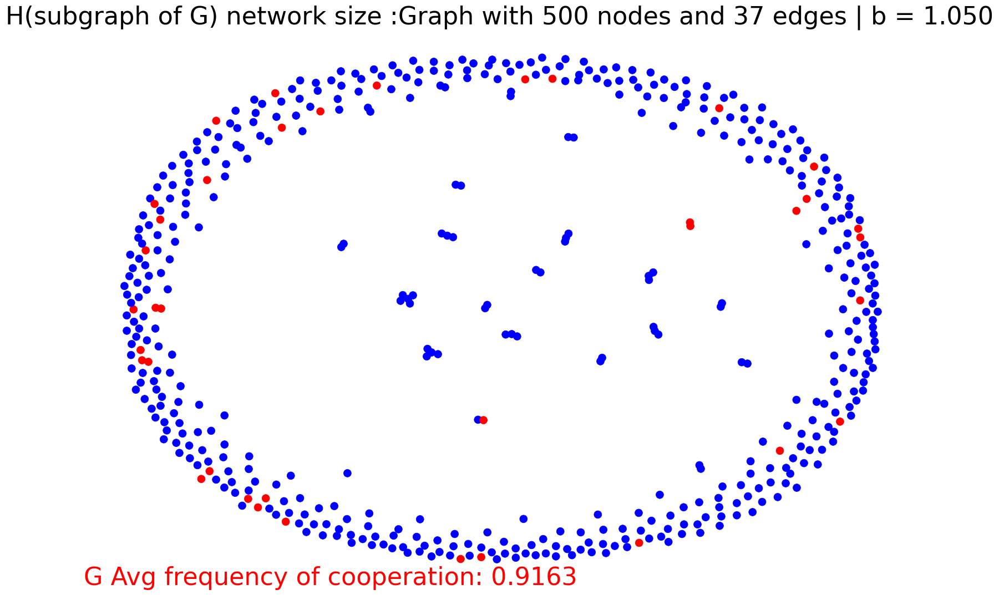

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.100, 达到动态平衡用时 1227.8534662723541 s


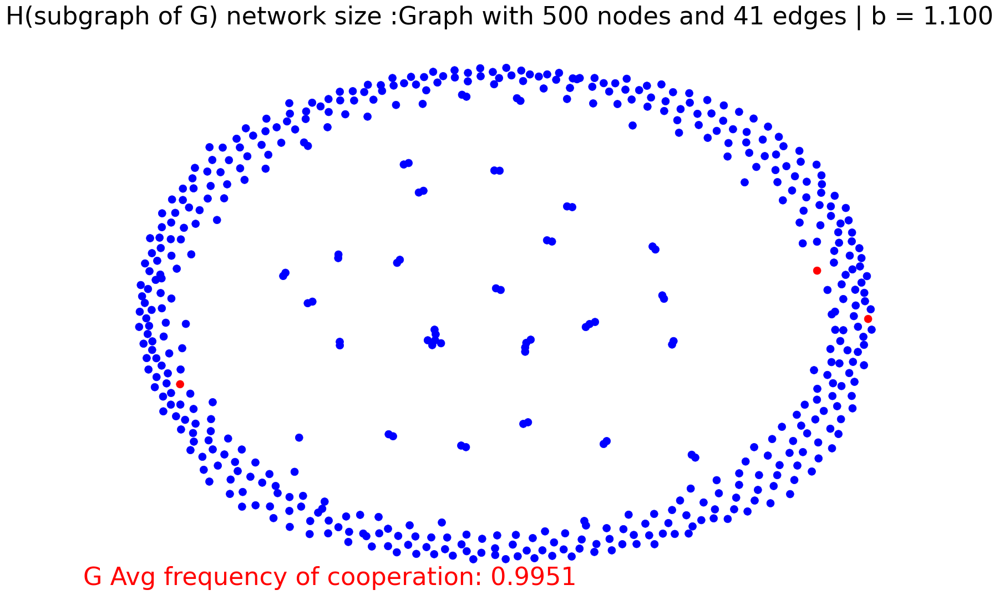

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.150, 达到动态平衡用时 1232.830476284027 s


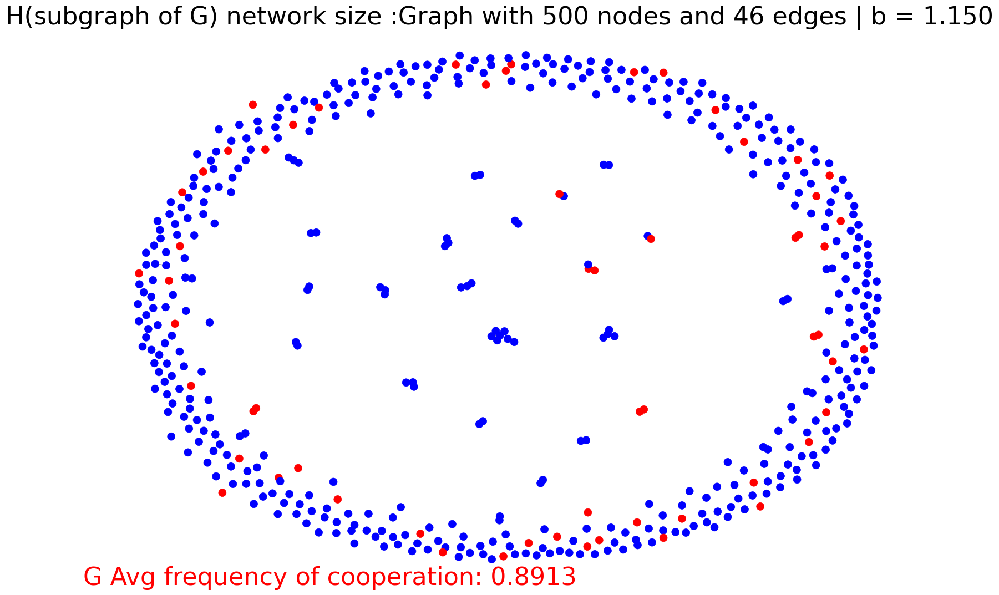

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.250, 达到动态平衡用时 1235.1671345233917 s


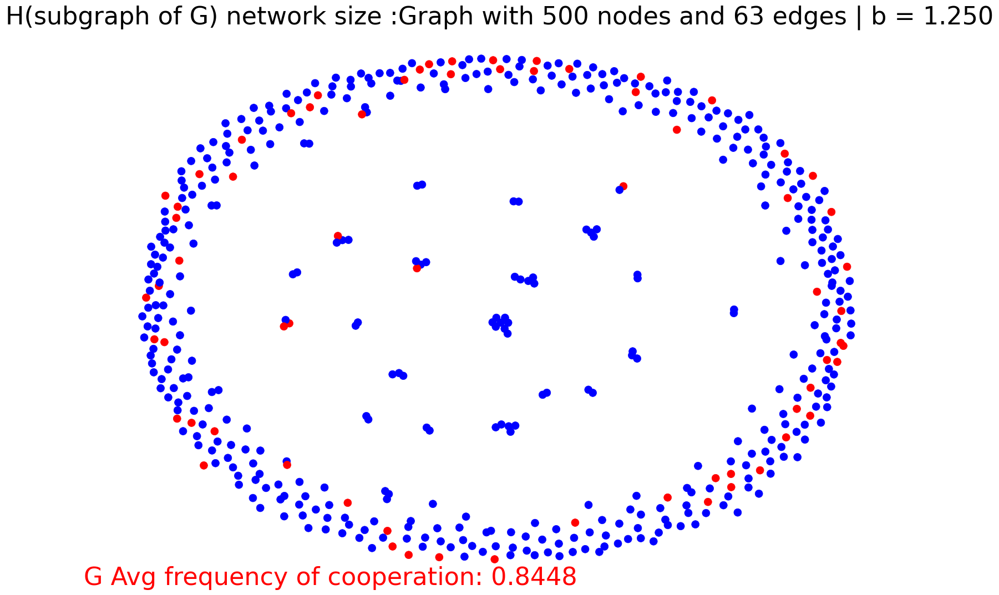

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.300, 达到动态平衡用时 1234.996383190155 s


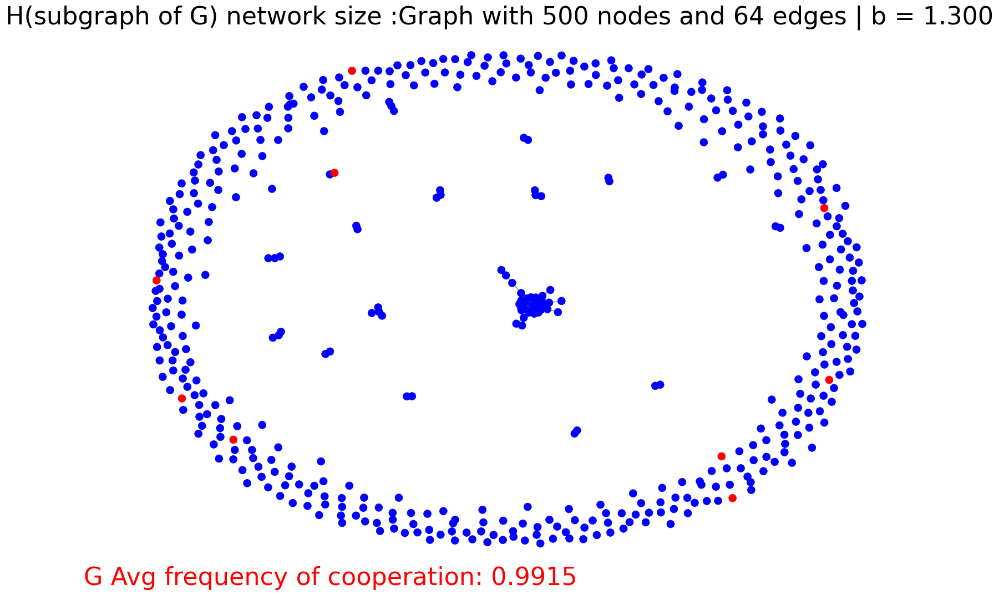

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.350, 达到动态平衡用时 1242.3105664253235 s


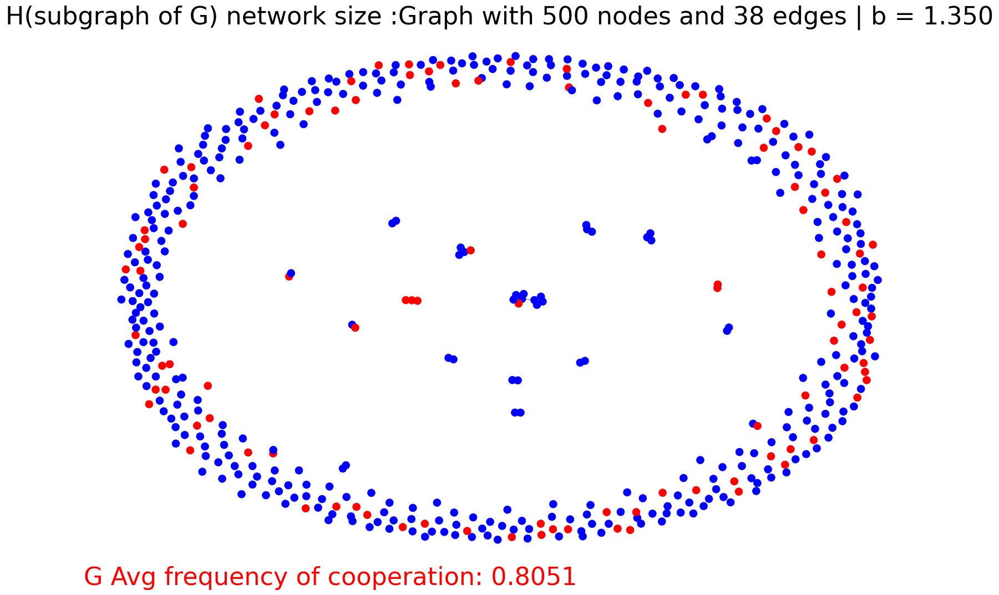

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.400, 达到动态平衡用时 1236.5262360572815 s


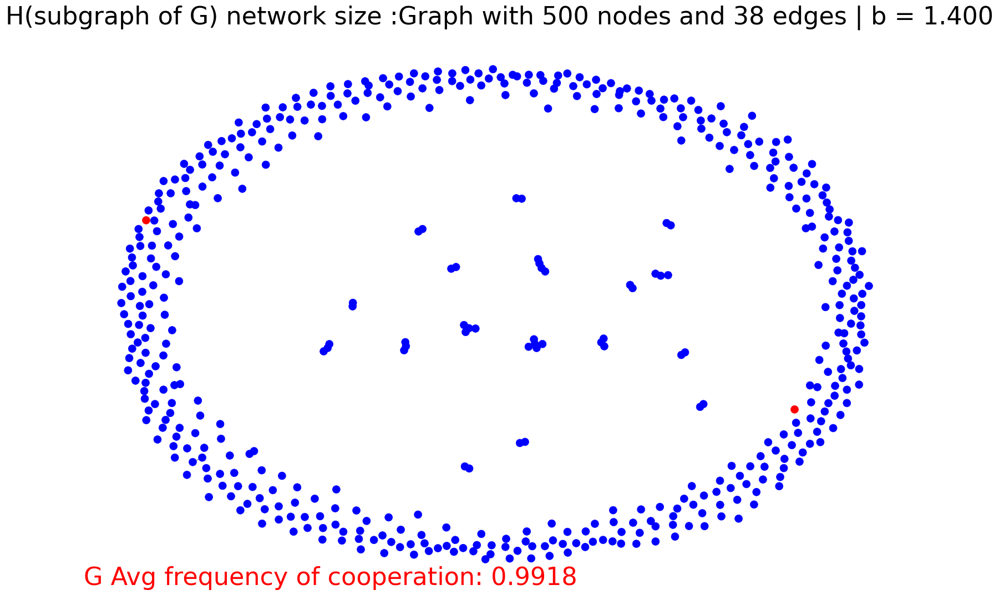

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.500, 达到动态平衡用时 1240.4293689727783 s


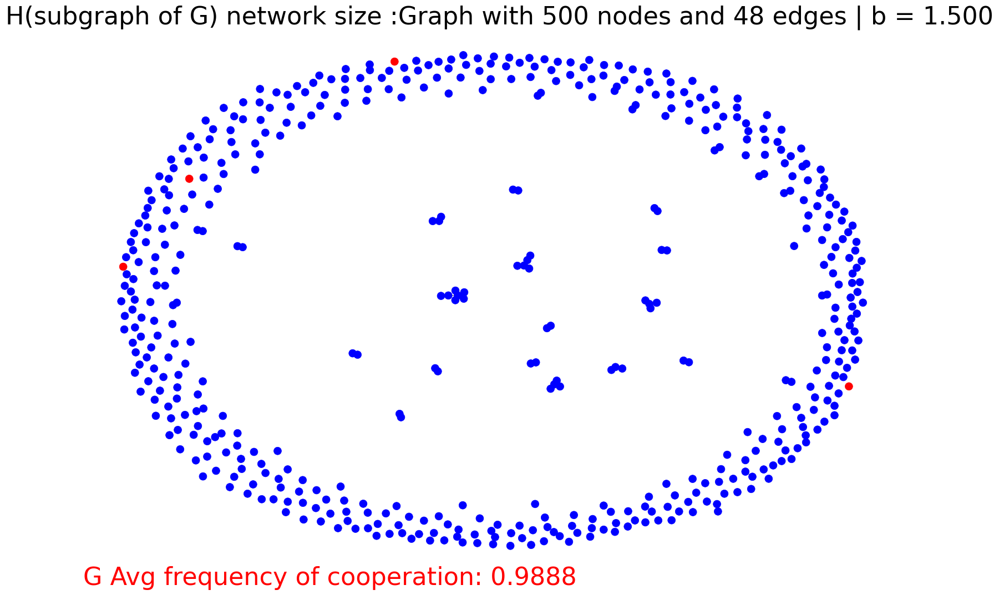

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.550, 达到动态平衡用时 1241.3681426048279 s


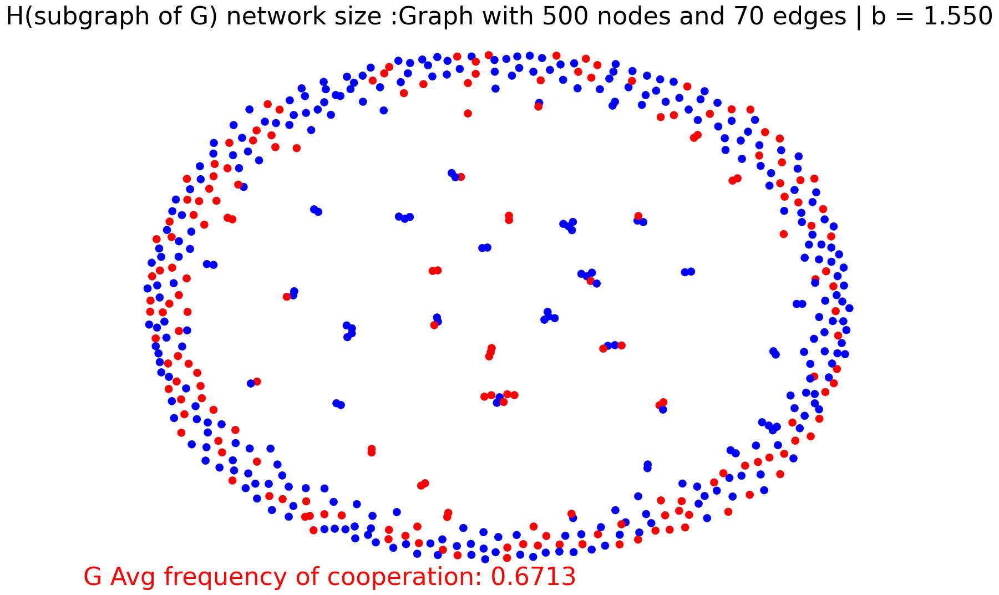

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.600, 达到动态平衡用时 1235.970810174942 s


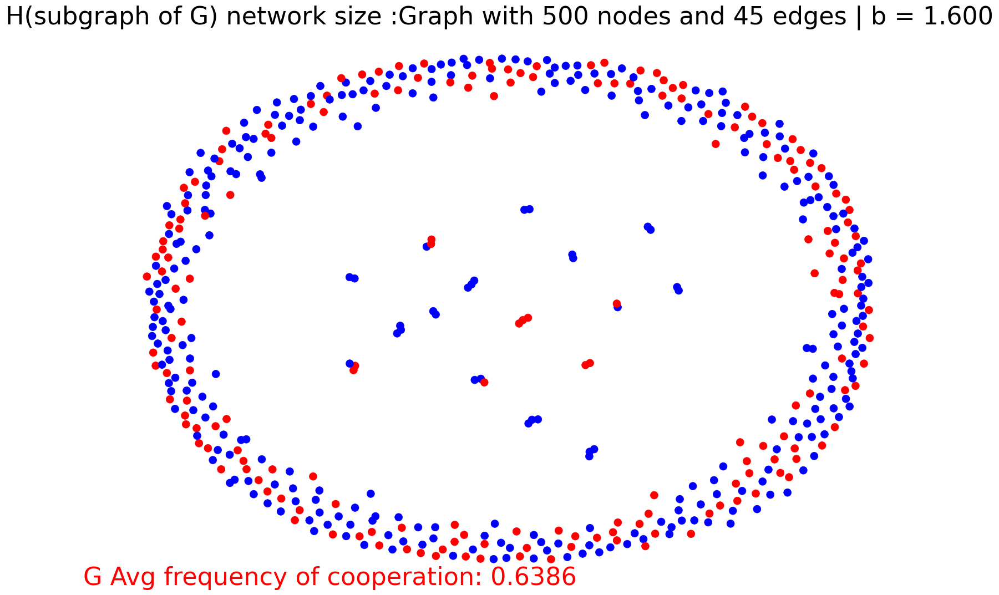

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.650, 达到动态平衡用时 1241.4040307998657 s


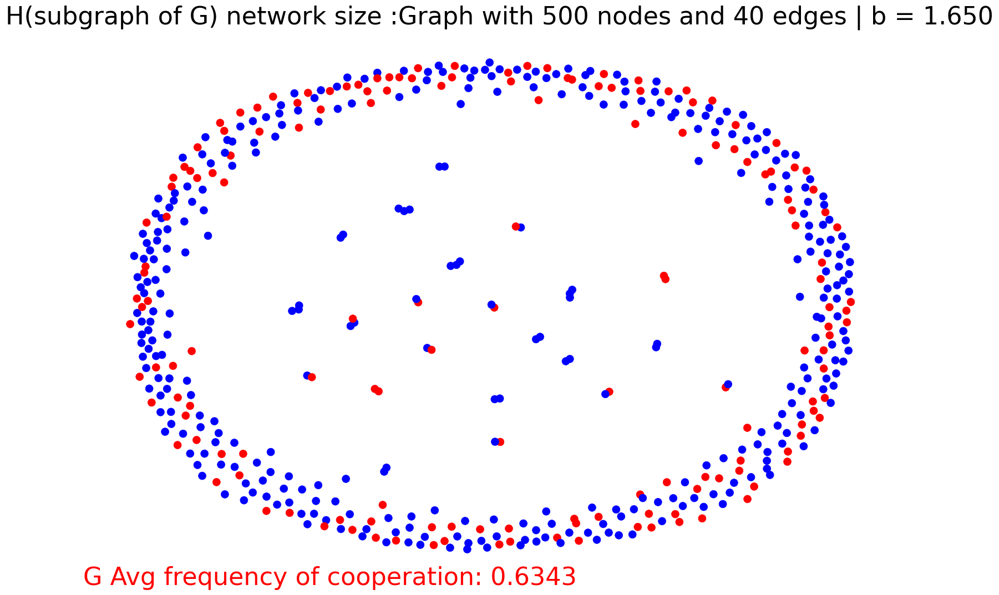

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.700, 达到动态平衡用时 1237.814748287201 s


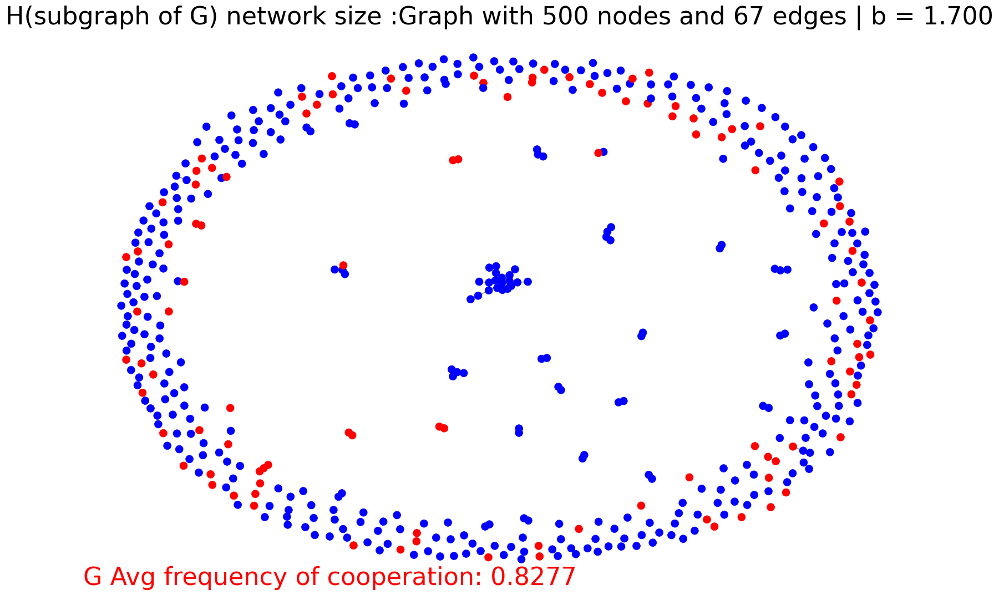

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.750, 达到动态平衡用时 1240.821433544159 s


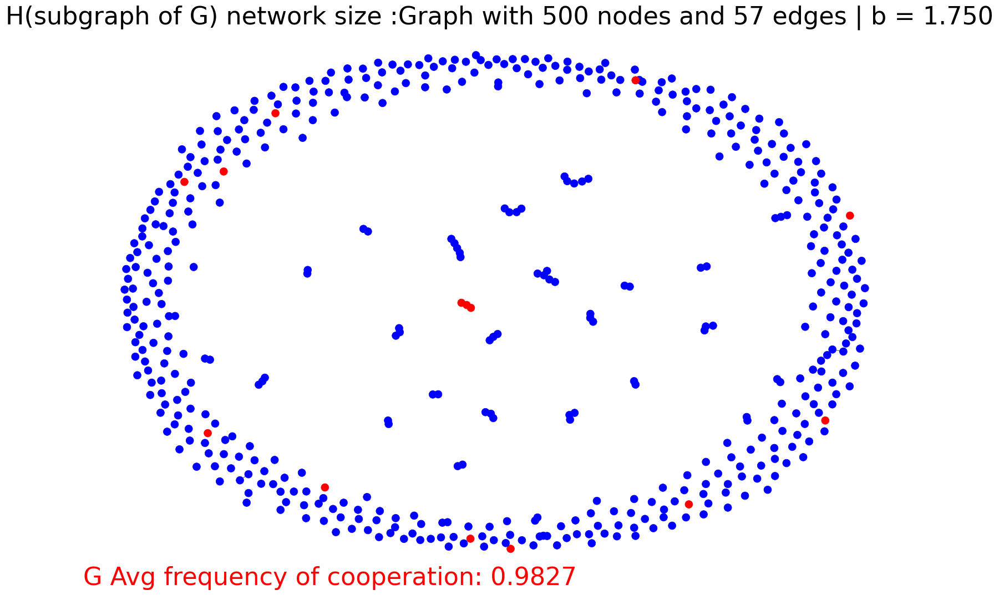

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.800, 达到动态平衡用时 1247.0222125053406 s


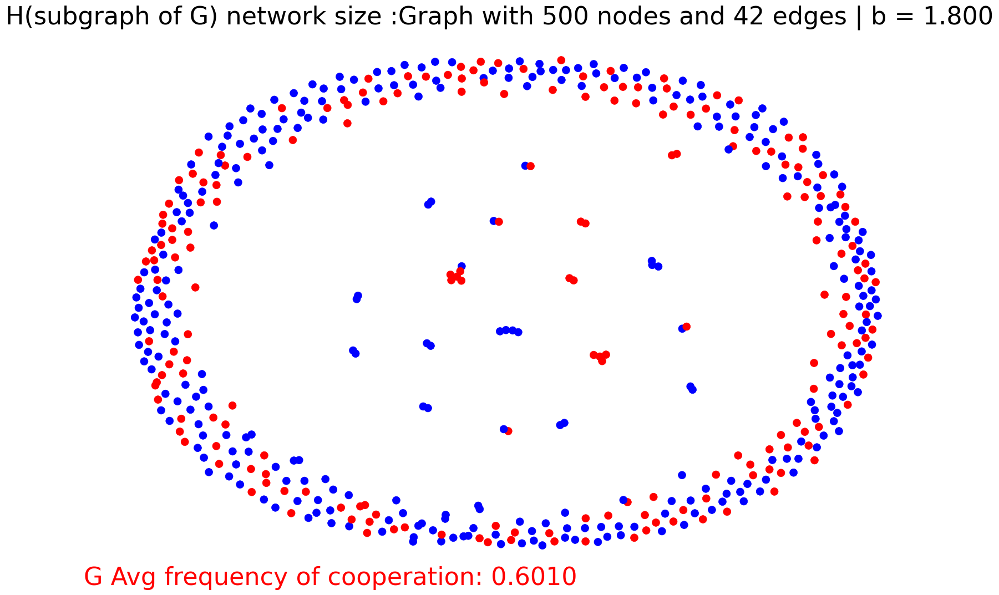

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.850, 达到动态平衡用时 1240.8137595653534 s


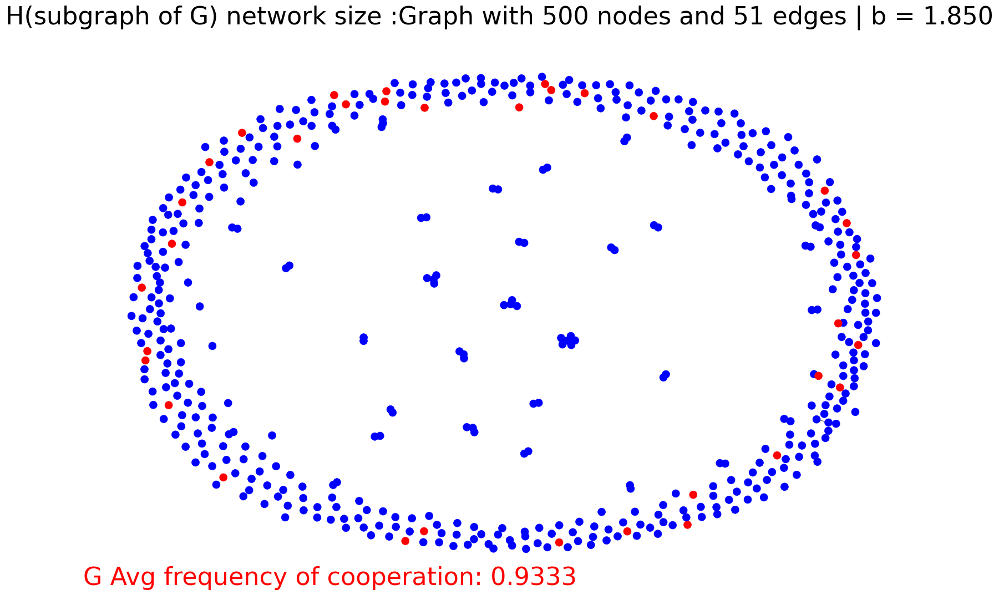

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.900, 达到动态平衡用时 1238.816924571991 s


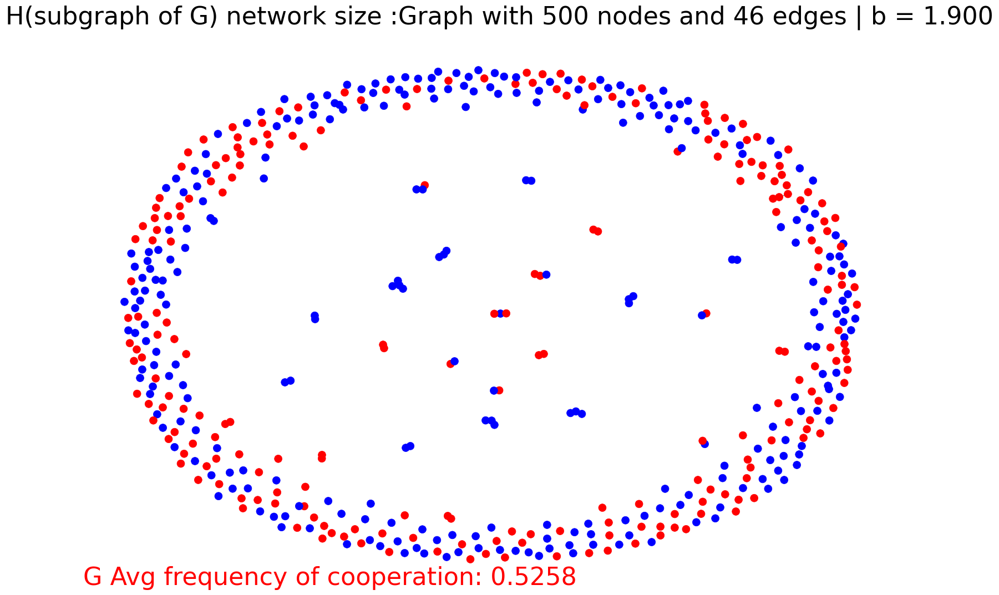

无标度网络大小为Graph with 10000 nodes and 19996 edges, b = 1.950, 达到动态平衡用时 1249.5343651771545 s


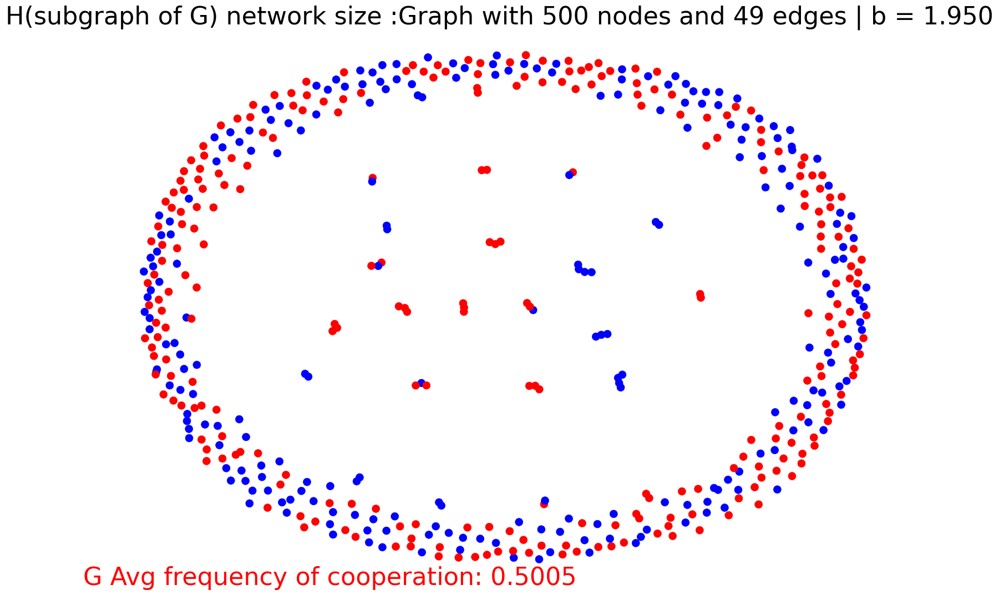

In [ ]:
freq_coop_bs=[]

G=Gs[0]

freq_coop_b=[]

for t,b in enumerate(np.array([1.05,1.1,1.15,1.25,1.3,1.35,1.4,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()


freq_coop_bs.append(freq_coop_b)


In [ ]:
print("Z=4",freq_coop_bs[0])


Z=4 [0.9162850000000001, 0.9950596000000019, 0.8912774999999994, 0.8447587000000002, 0.991507999999999, 0.8051471999999993, 0.9918464999999993, 0.9888431000000004, 0.6712636999999999, 0.6385668999999995, 0.6343180000000005, 0.8277203999999995, 0.9826533999999989, 0.6009652999999996, 0.9332665, 0.5257895000000006, 0.5005188999999995]


无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.050, 达到动态平衡用时 1792.511858701706 s


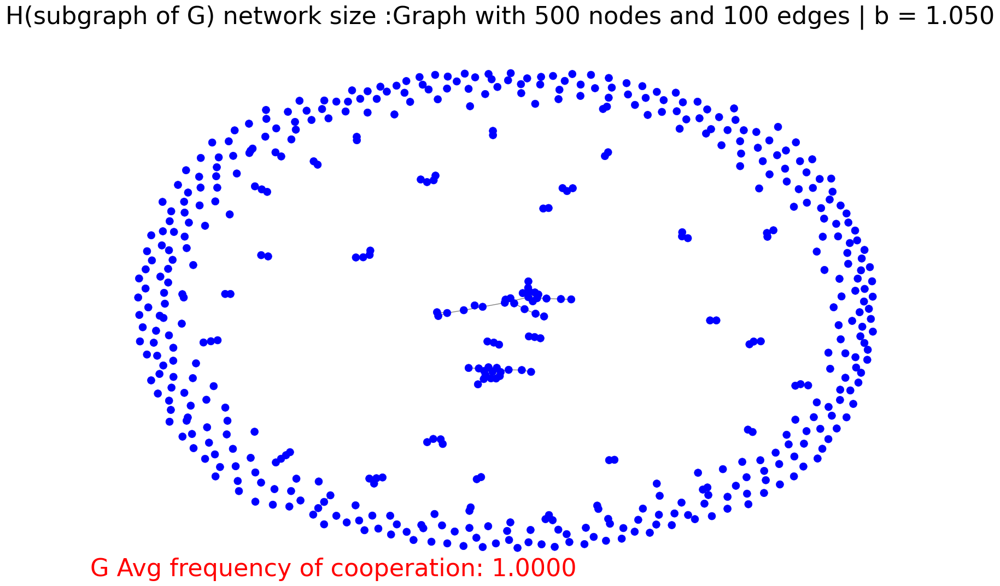

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.100, 达到动态平衡用时 1770.5785856246948 s


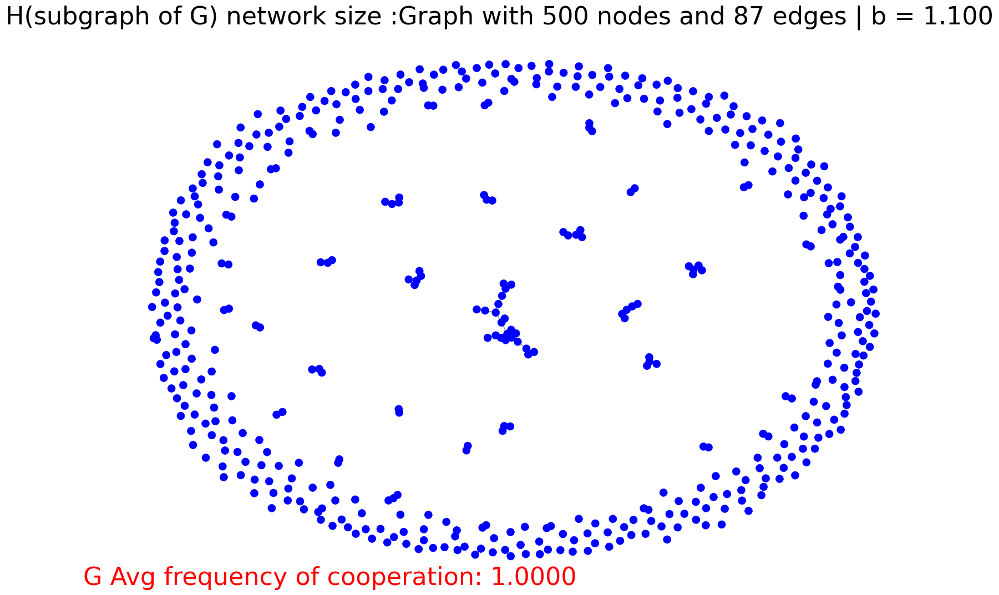

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.150, 达到动态平衡用时 1737.8789732456207 s


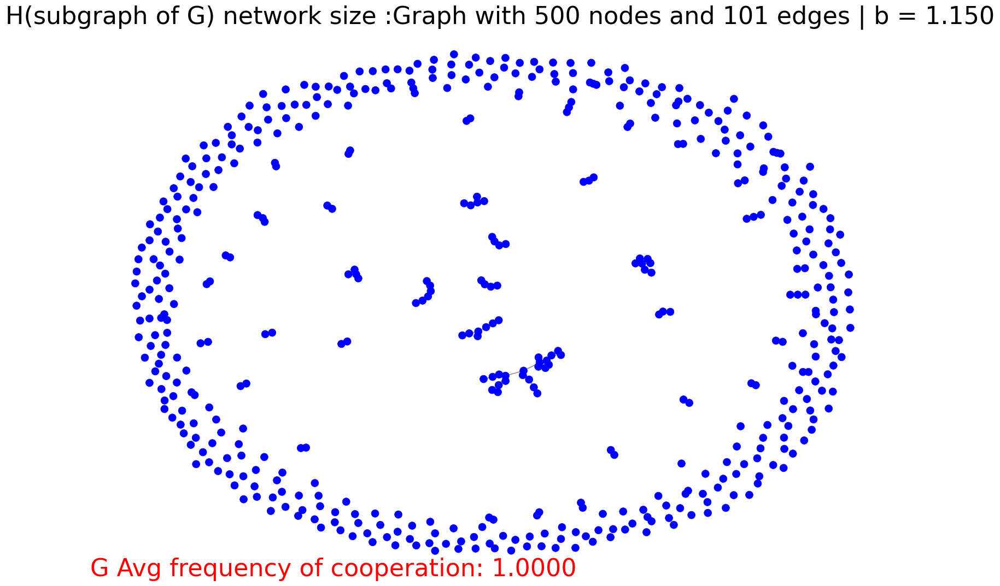

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.250, 达到动态平衡用时 1718.43474984169 s


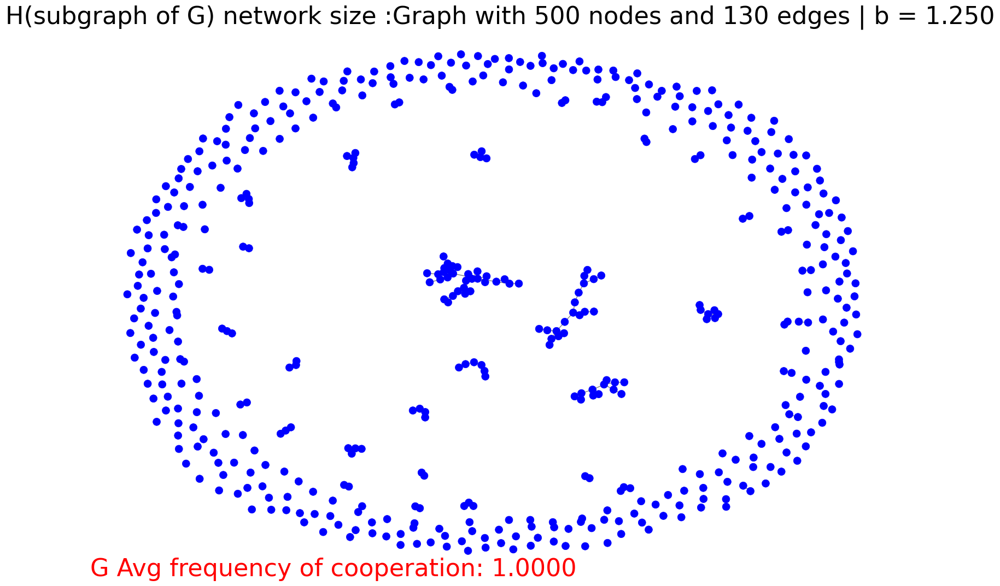

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.300, 达到动态平衡用时 1725.0755858421326 s


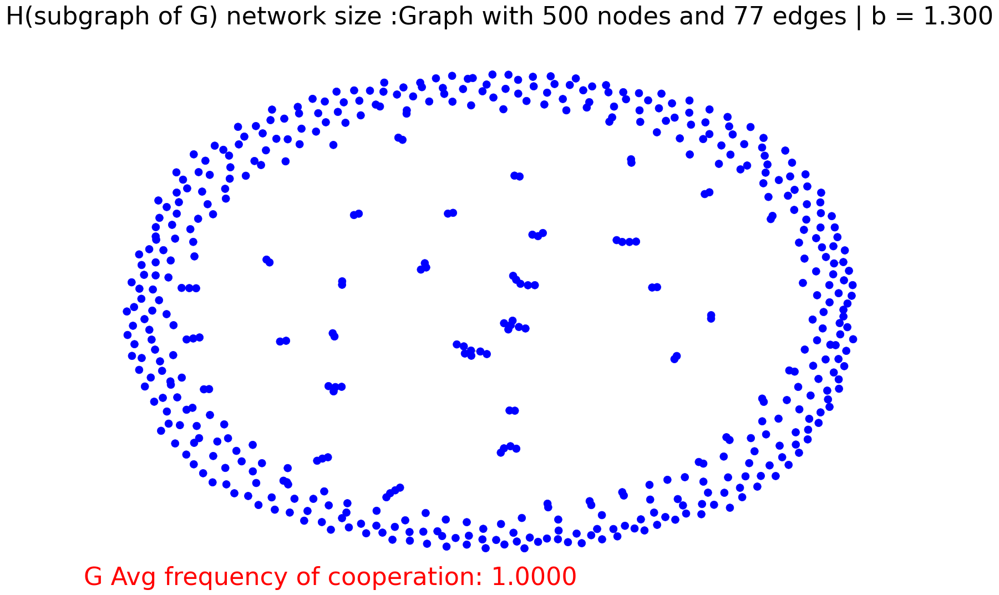

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.350, 达到动态平衡用时 1719.0852499008179 s


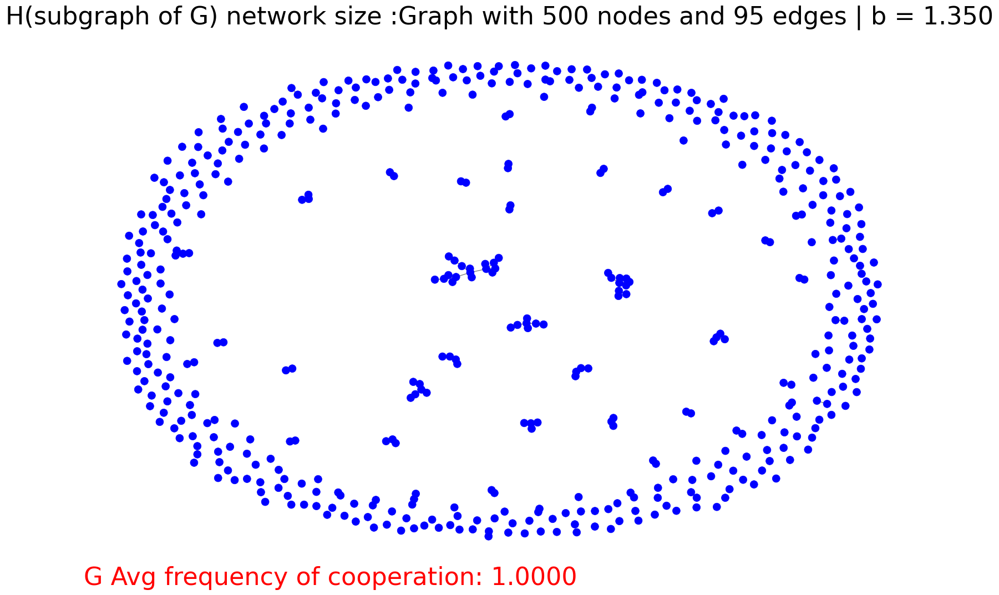

In [ ]:
G=Gs[1]

freq_coop_b=[]

for t,b in enumerate(np.array([1.05,1.1,1.15,1.25,1.3,1.35,1.4,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()


freq_coop_bs.append(freq_coop_b)

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.400, 达到动态平衡用时 1780.5150427818298 s


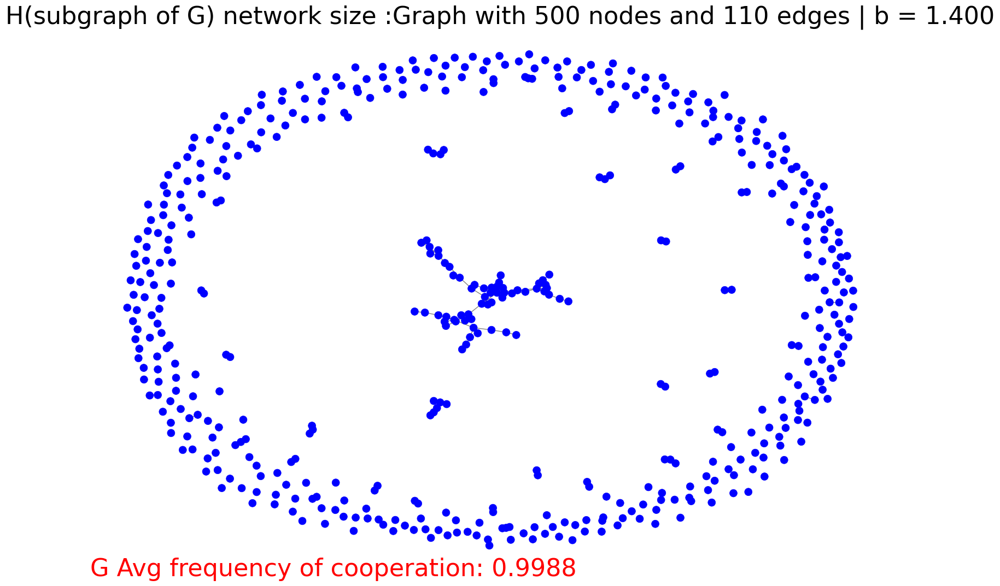

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.500, 达到动态平衡用时 1786.9676554203033 s


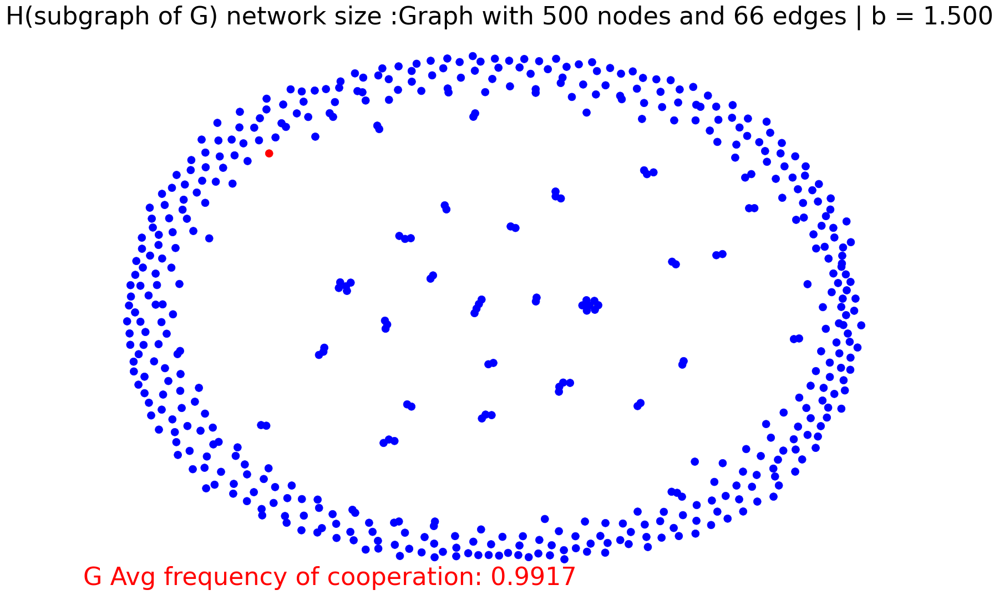

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.550, 达到动态平衡用时 1753.3842828273773 s


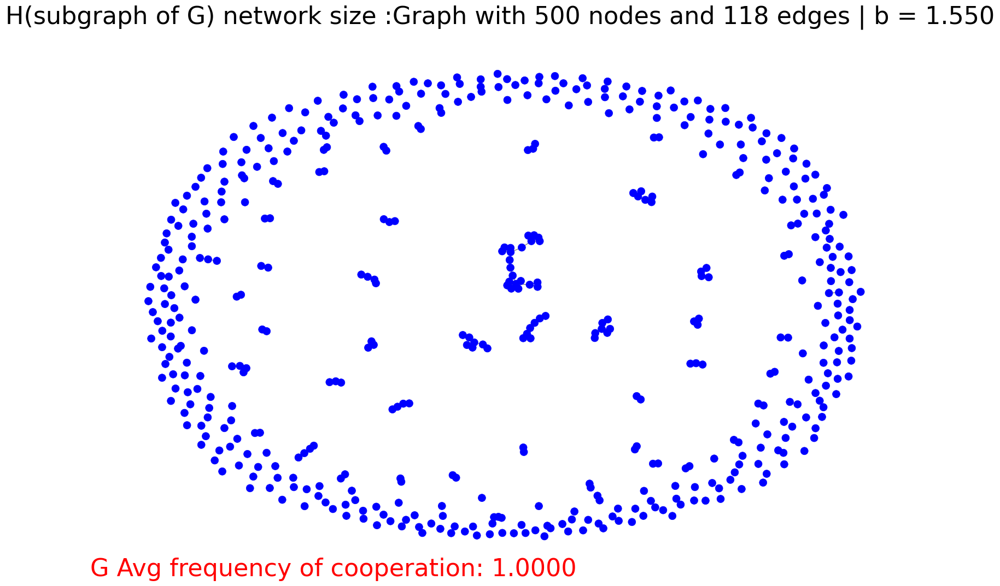

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.600, 达到动态平衡用时 1757.4758632183075 s


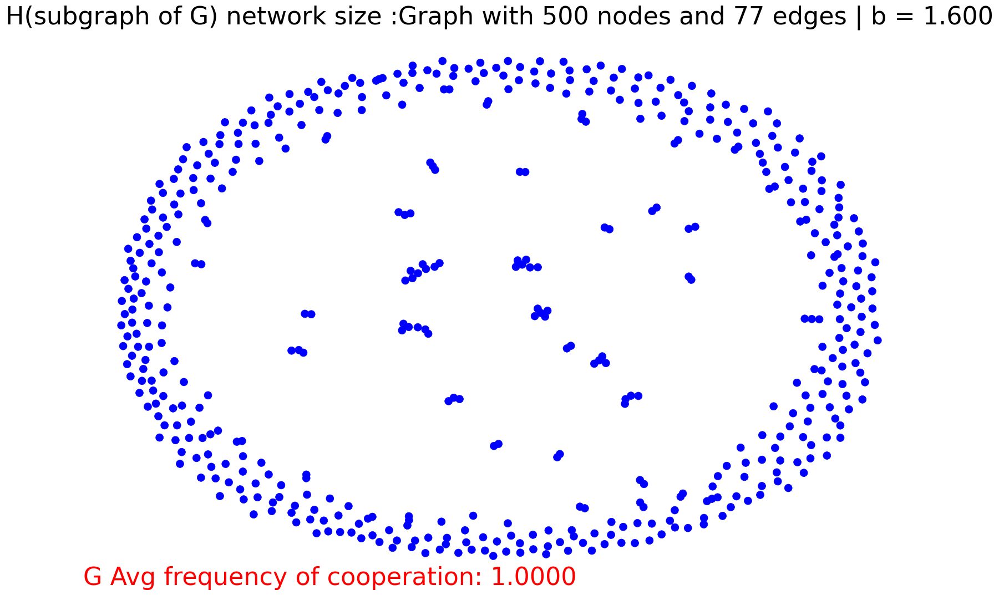

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.650, 达到动态平衡用时 1770.1176290512085 s


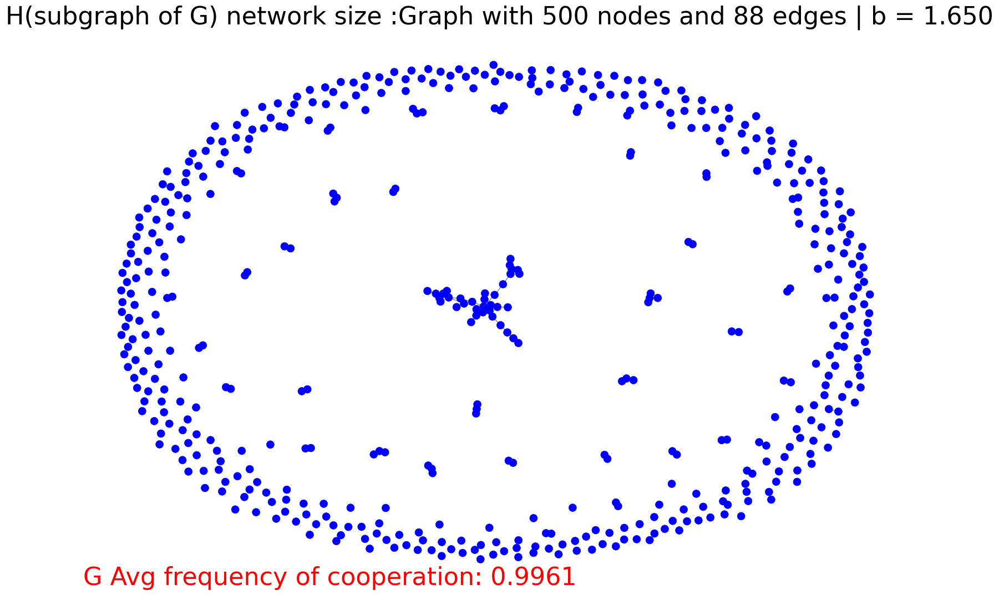

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.700, 达到动态平衡用时 1767.802324295044 s


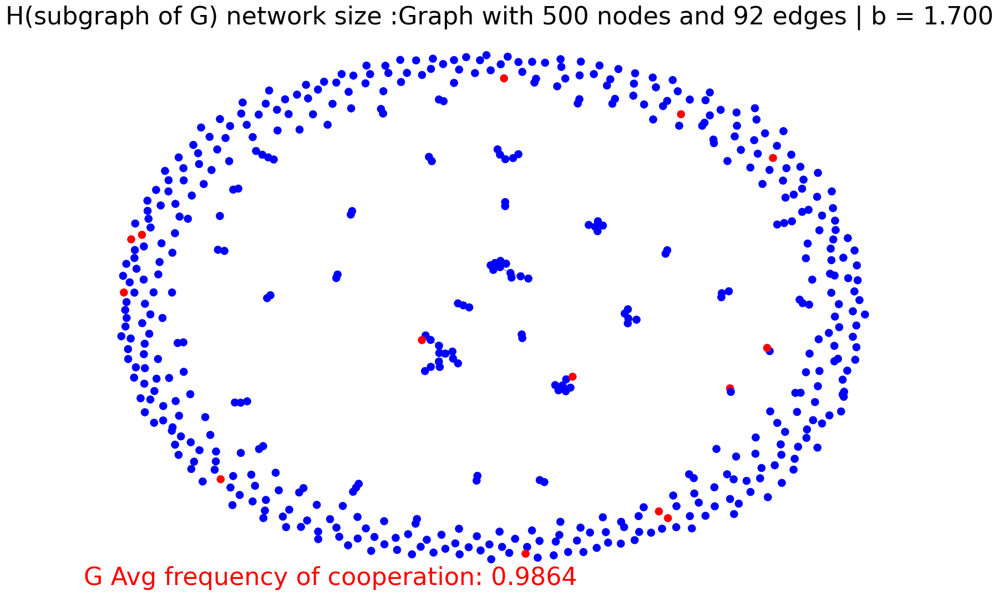

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.750, 达到动态平衡用时 1805.7199487686157 s


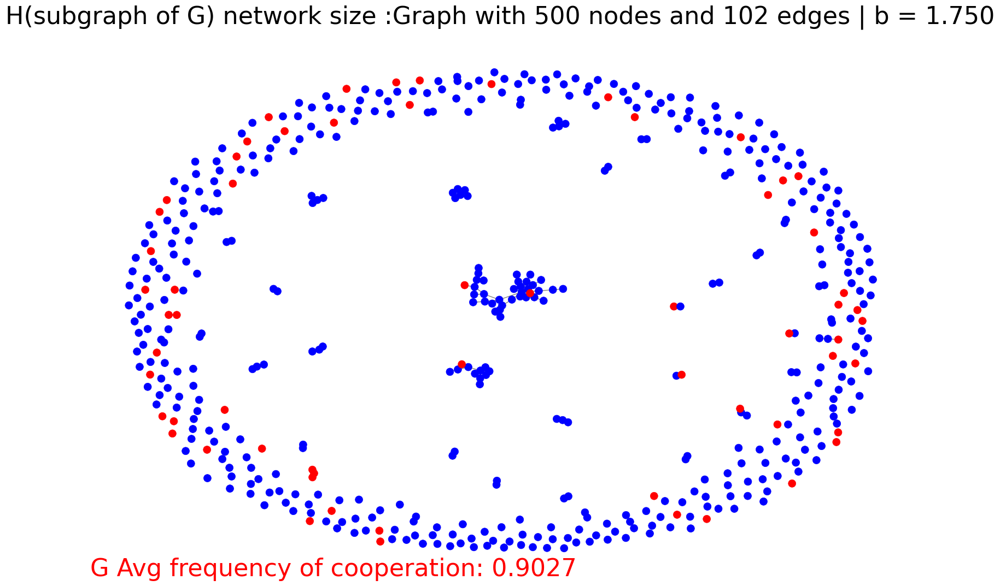

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.800, 达到动态平衡用时 1798.8575527668 s


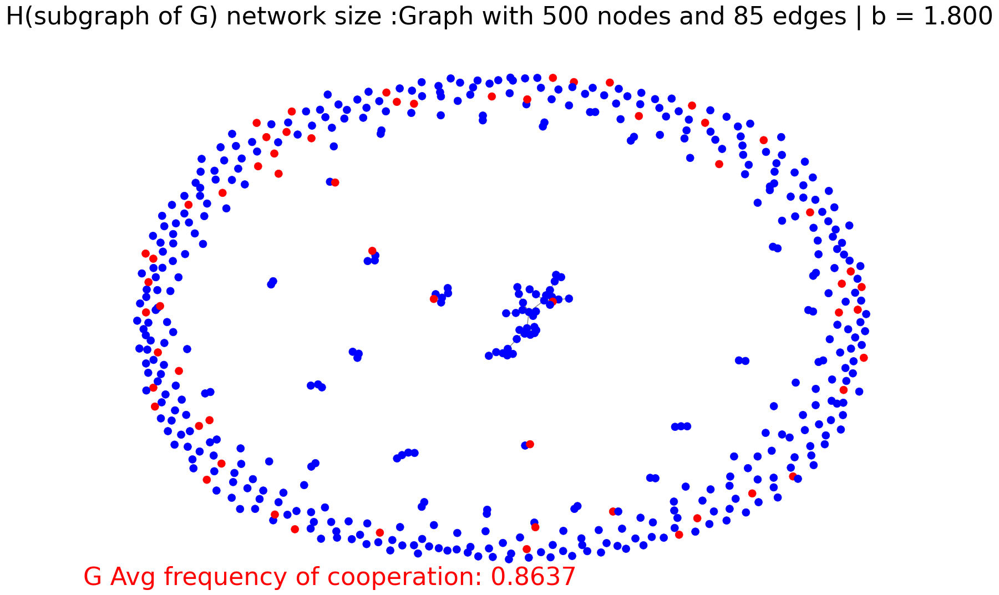

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.850, 达到动态平衡用时 1826.504668712616 s


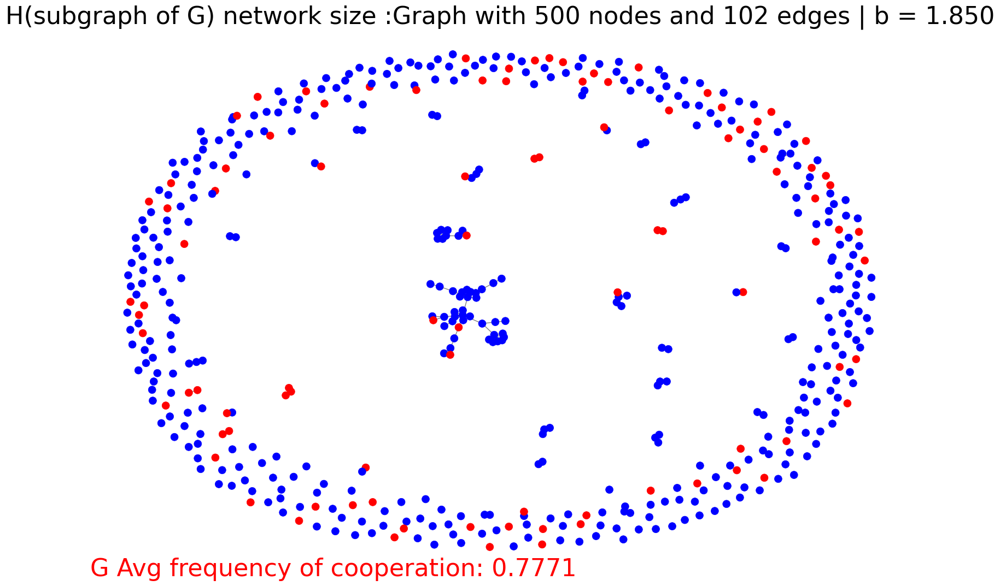

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.900, 达到动态平衡用时 1810.9005055427551 s


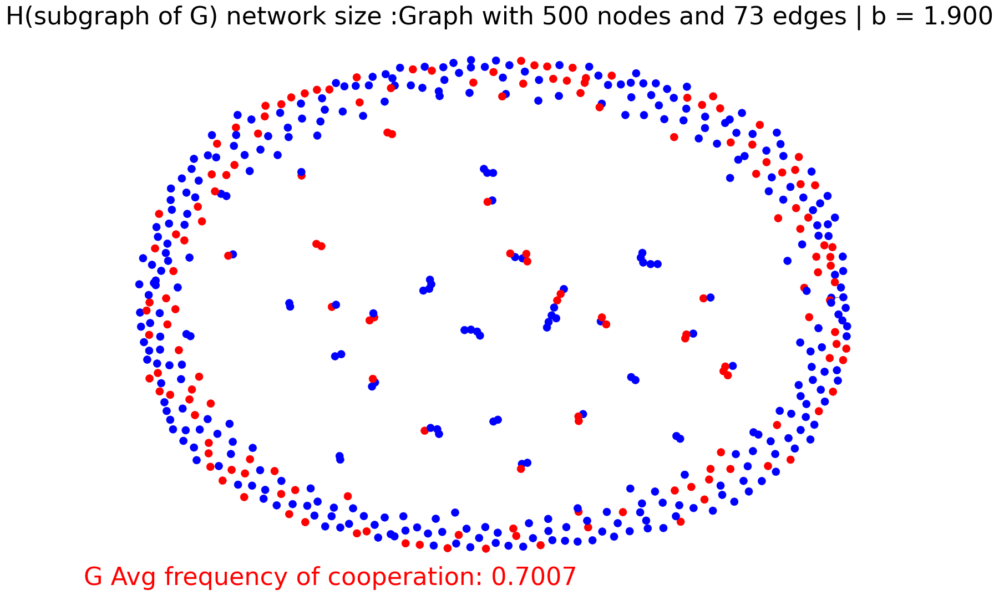

无标度网络大小为Graph with 10000 nodes and 39984 edges, b = 1.950, 达到动态平衡用时 1831.635421037674 s


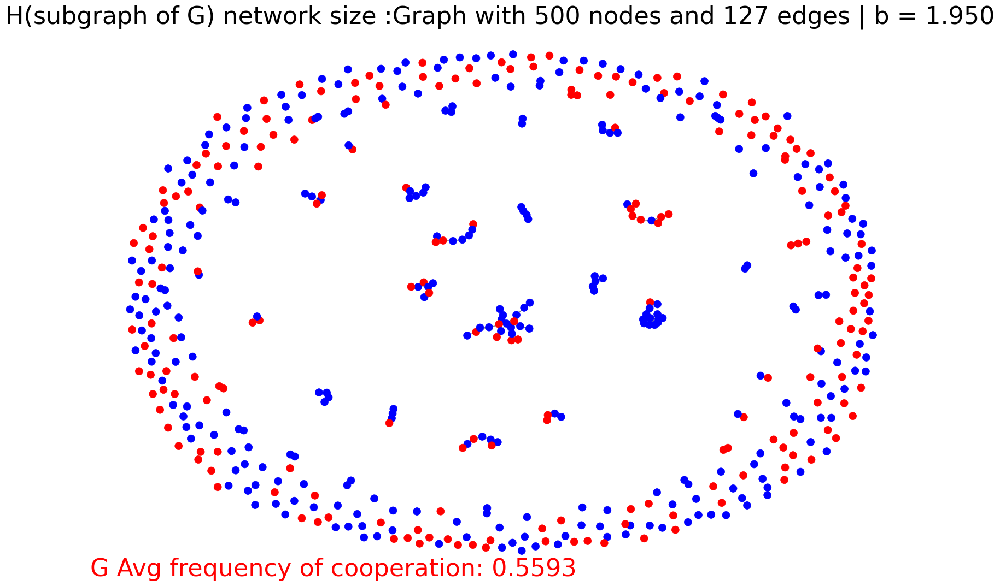

NameError: name 'freq_coop_bs' is not defined

In [ ]:
G=Gs[1]

freq_coop_b=[]

for t,b in enumerate(np.array([1.4,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()


freq_coop_bs.append(freq_coop_b)

In [ ]:
print("Z=8",freq_coop_b)



Z=8 [0.9987713999999996, 0.991706799999999, 1.0, 1.0, 0.9961254999999997, 0.9864361000000018, 0.9027476000000001, 0.8636579999999997, 0.7771358000000002, 0.7006615999999993, 0.5592531000000001]


无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.000, 达到动态平衡用时 2907.1265501976013 s


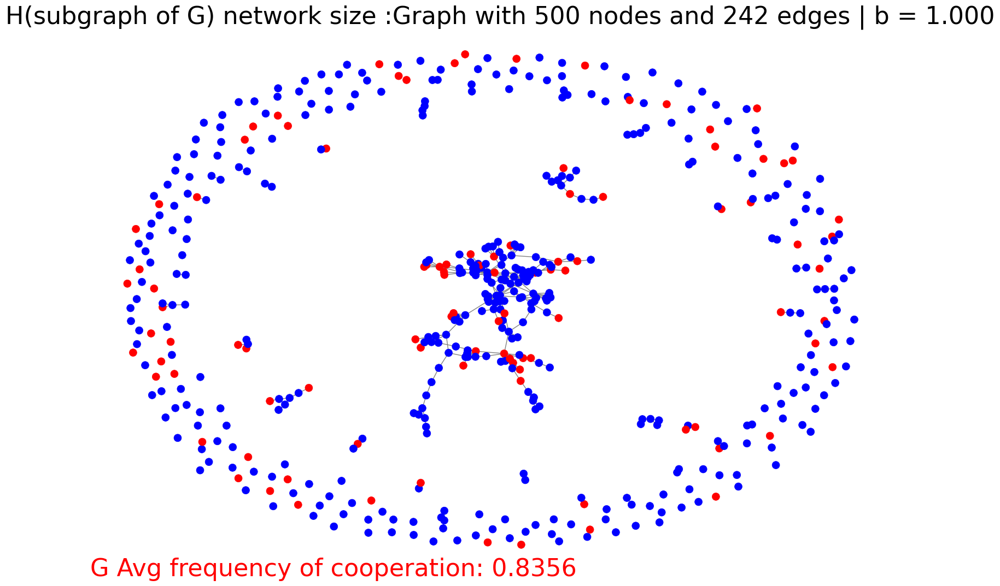

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.050, 达到动态平衡用时 2899.305609226227 s


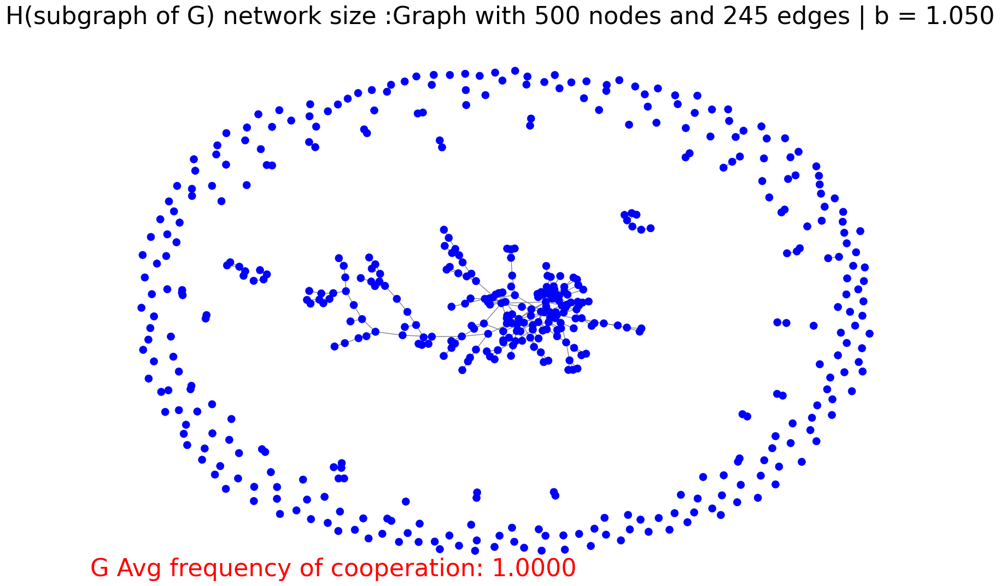

In [ ]:
G=Gs[2]

freq_coop_b=[]

for t,b in enumerate(T):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()



无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.150, 达到动态平衡用时 2788.77911400795 s


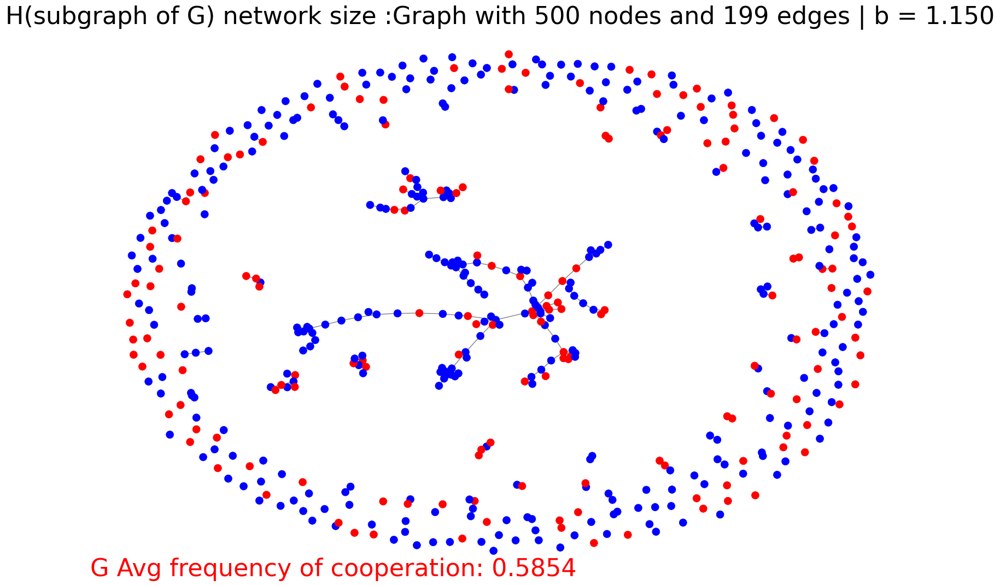

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.200, 达到动态平衡用时 2722.060789823532 s


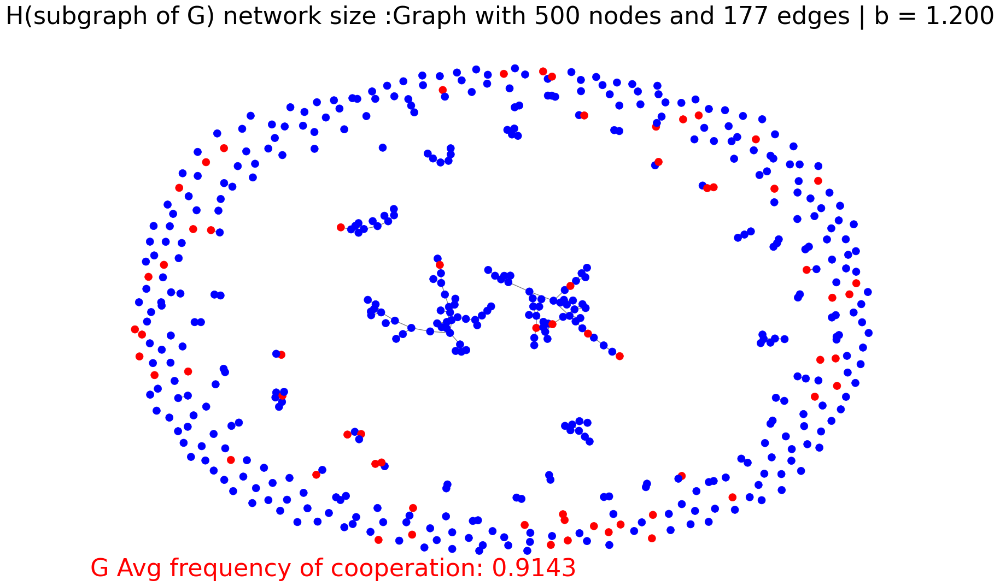

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.250, 达到动态平衡用时 2713.4655301570892 s


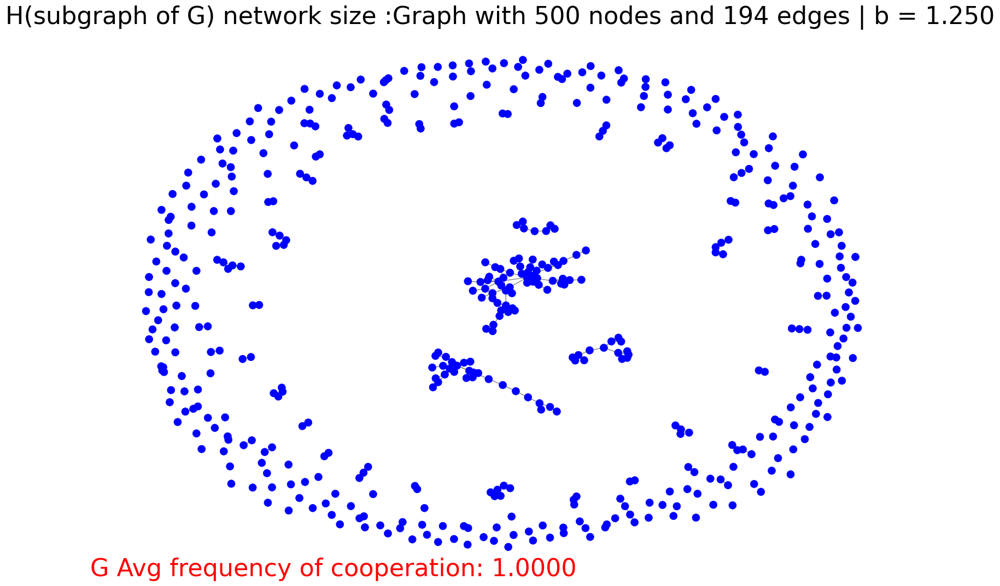

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.300, 达到动态平衡用时 2740.5891983509064 s


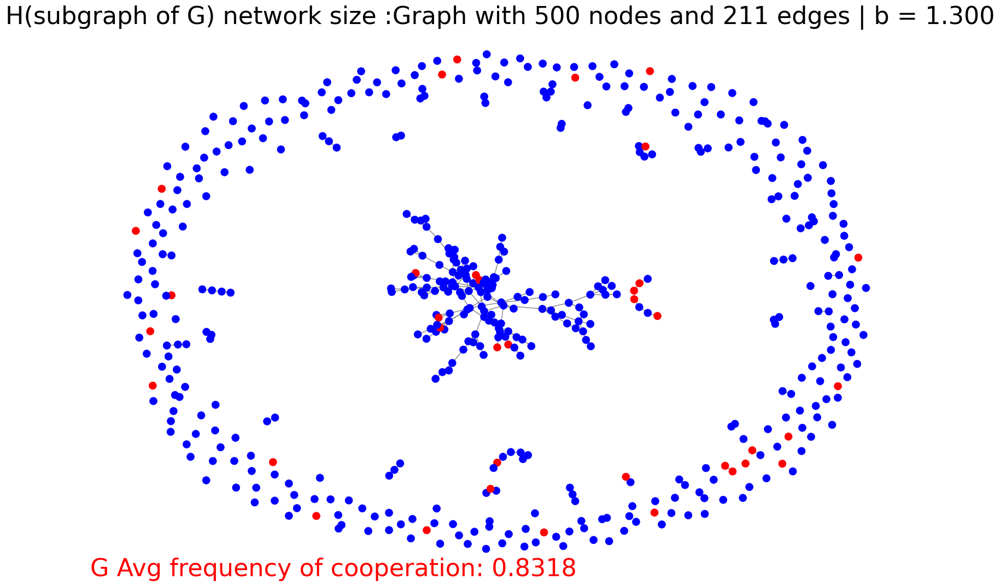

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.350, 达到动态平衡用时 2844.049485206604 s


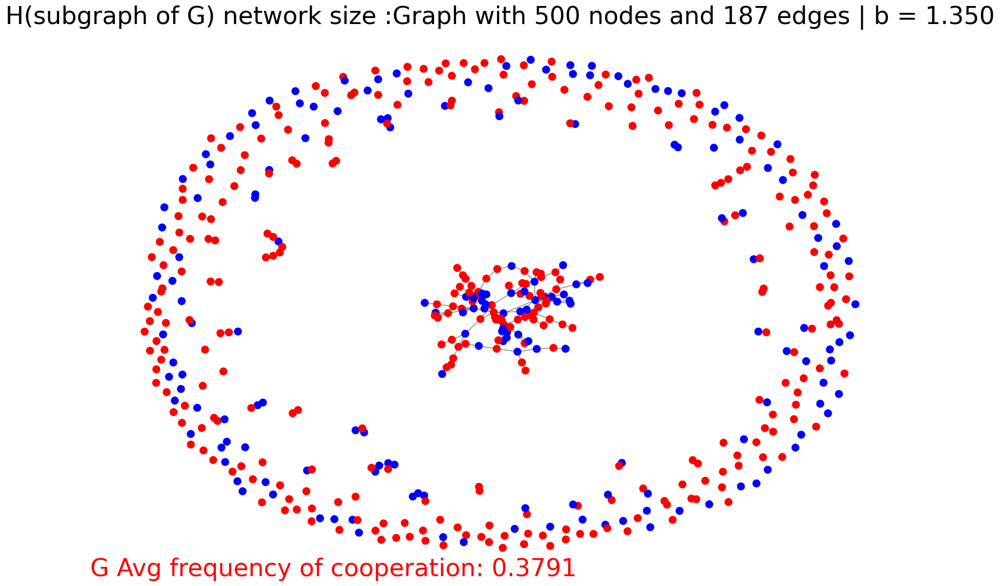

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.400, 达到动态平衡用时 2807.0964736938477 s


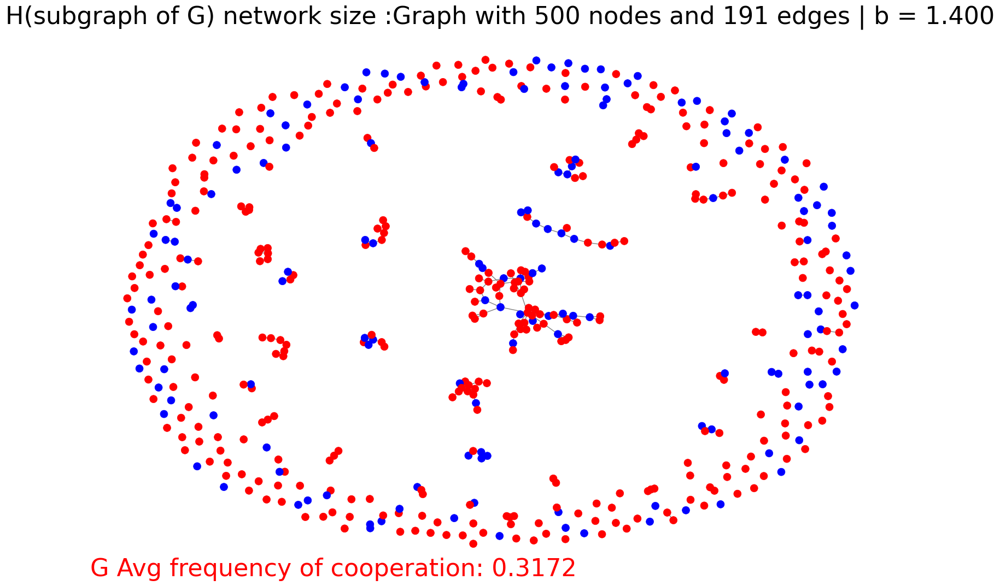

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.450, 达到动态平衡用时 2825.9733452796936 s


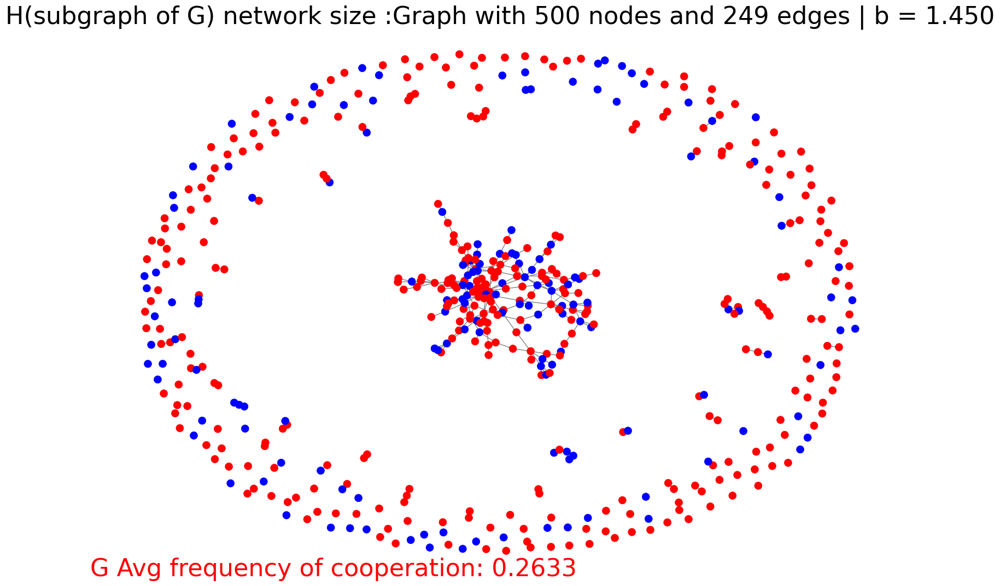

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.500, 达到动态平衡用时 2791.0201518535614 s


In [ ]:
G=Gs[2]

freq_coop_b=[]

for t,b in enumerate(np.array([1.15,1.2,1.25,1.3,1.35,1.4,1.45,1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()



无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.500, 达到动态平衡用时 2988.323532104492 s


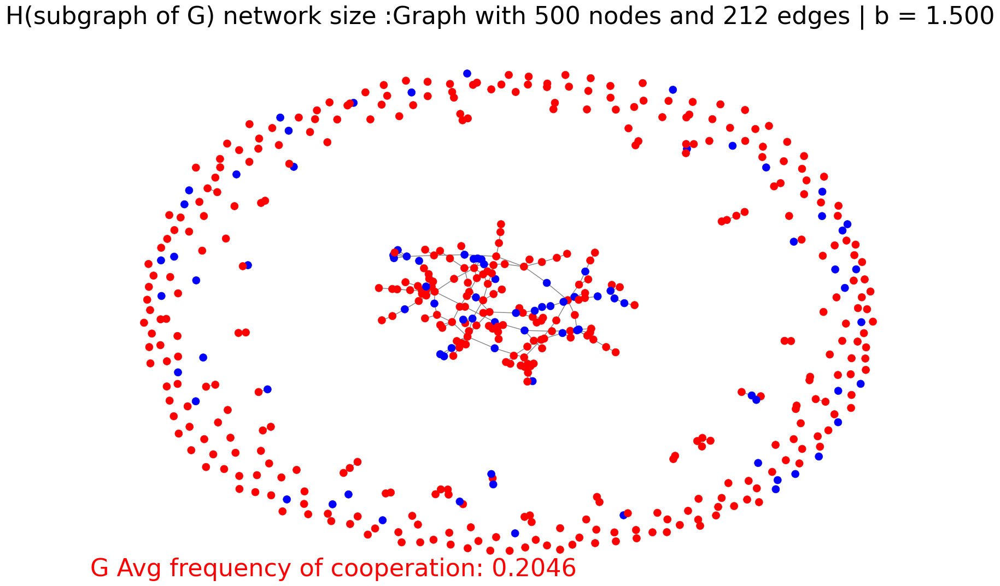

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.550, 达到动态平衡用时 2947.3437786102295 s


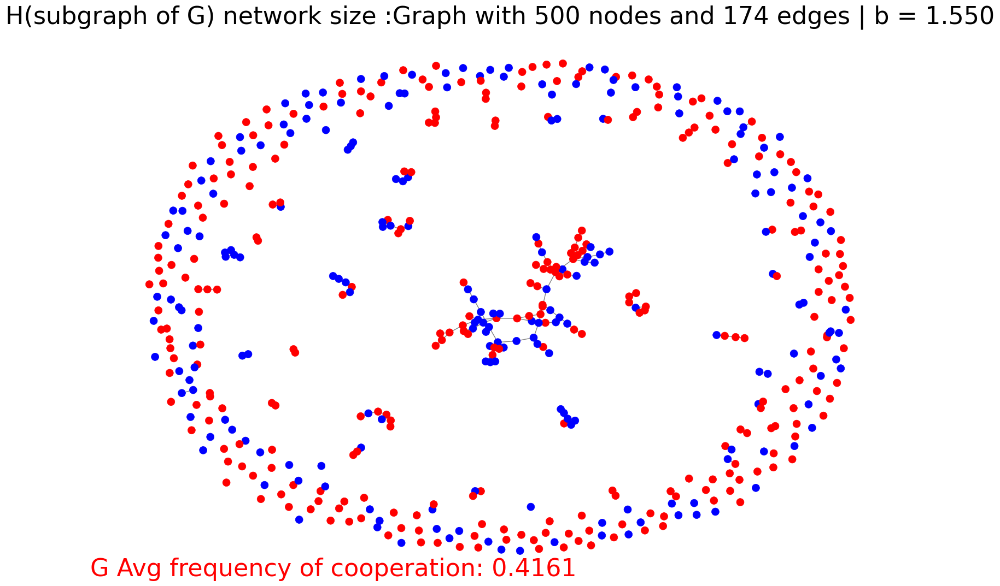

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.600, 达到动态平衡用时 2941.8073971271515 s


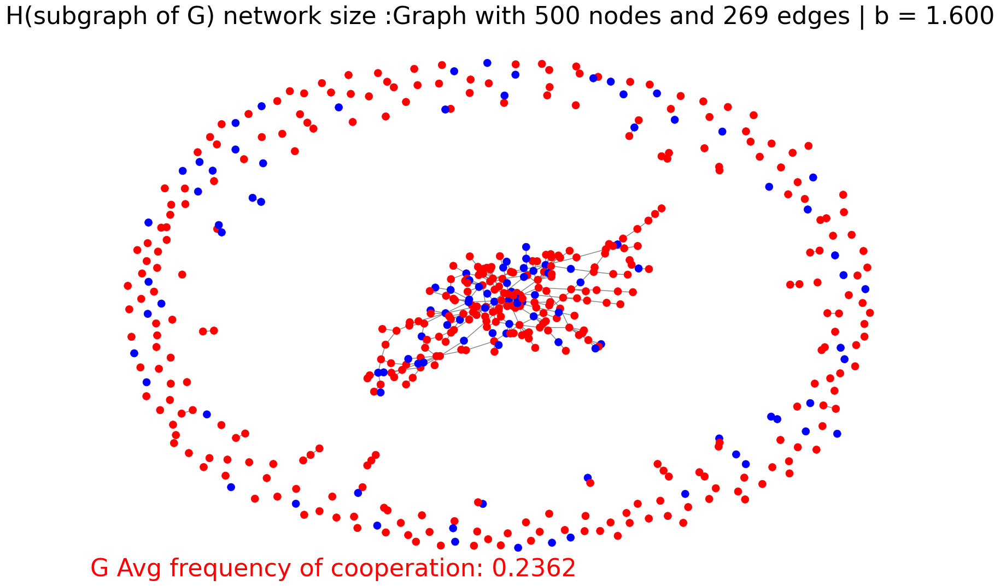

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.650, 达到动态平衡用时 2942.4204030036926 s


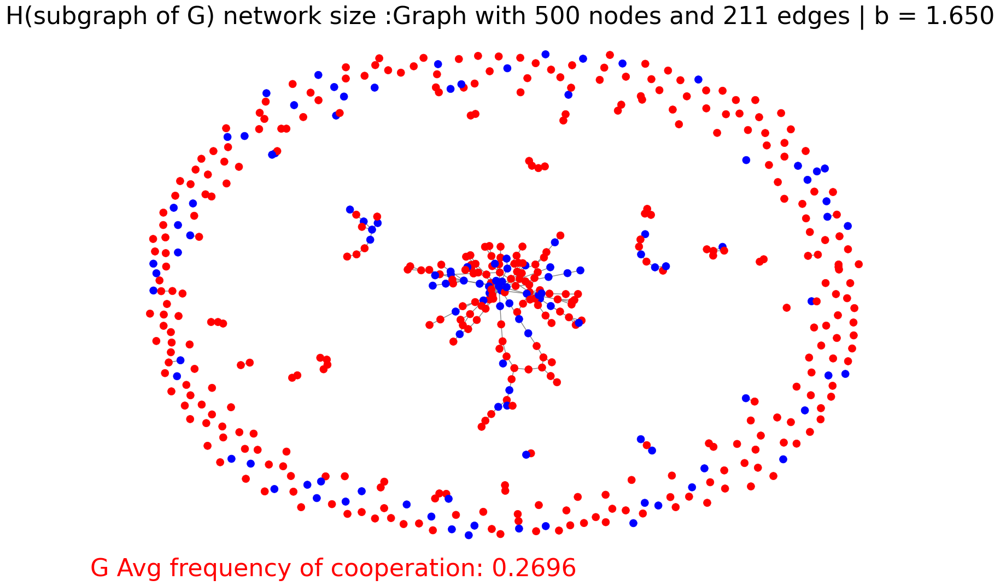

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.700, 达到动态平衡用时 2942.986369371414 s


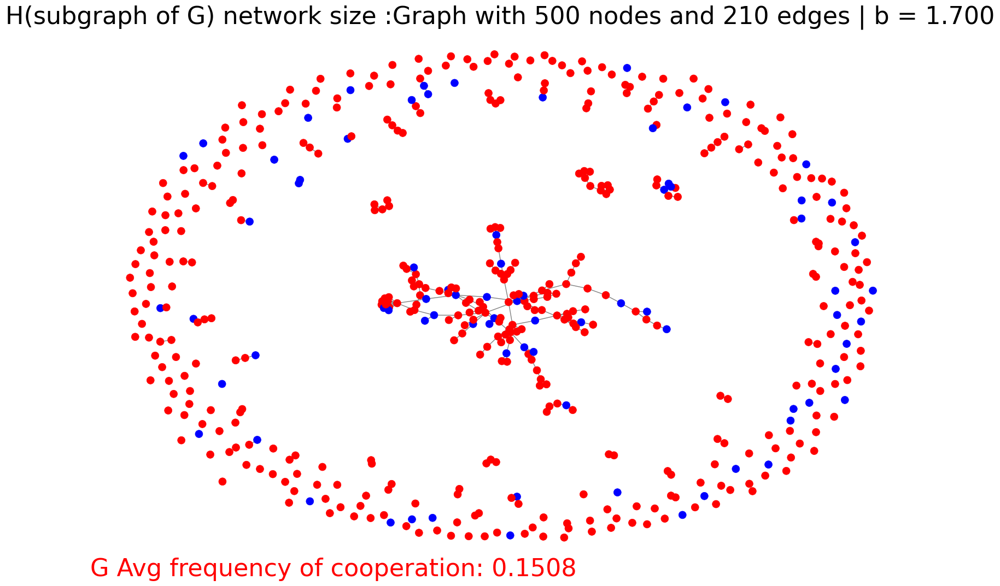

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.750, 达到动态平衡用时 2927.8826308250427 s


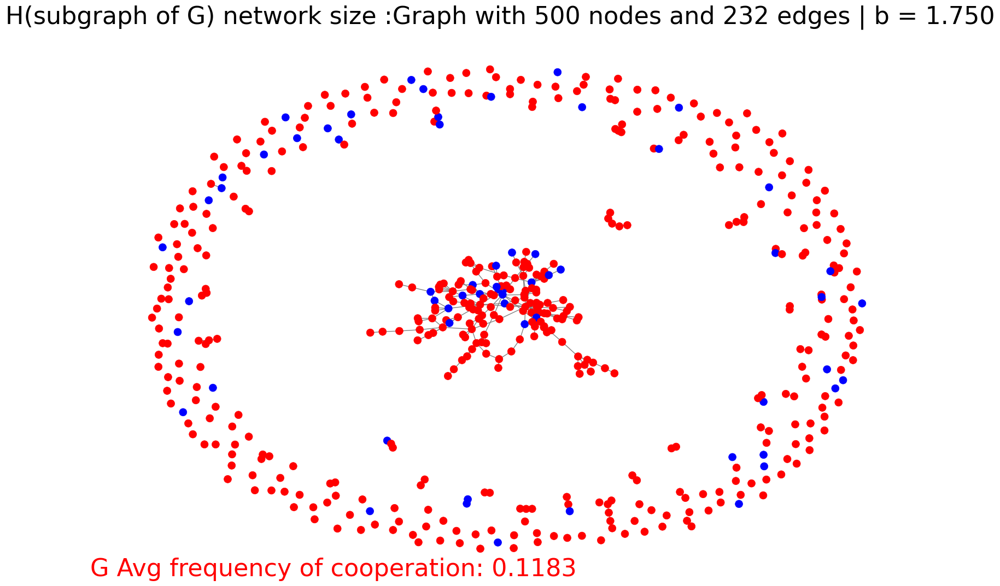

In [ ]:
G=Gs[2]

freq_coop_b=[]

for t,b in enumerate(np.array([1.5,1.55,1.6,1.65,1.7,1.75,1.8,1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()



无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.850, 达到动态平衡用时 1681.9919571876526 s


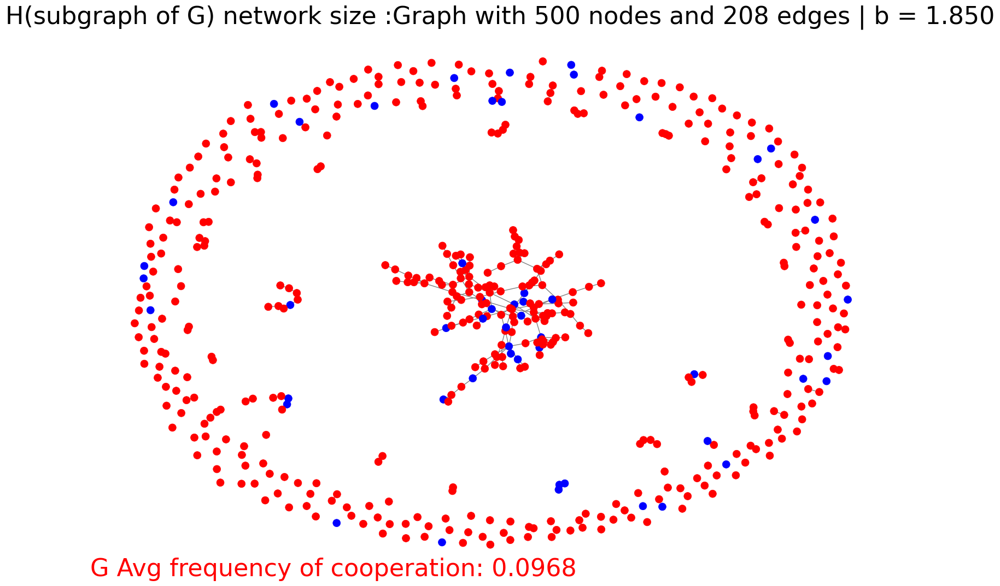

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.900, 达到动态平衡用时 1696.0165395736694 s


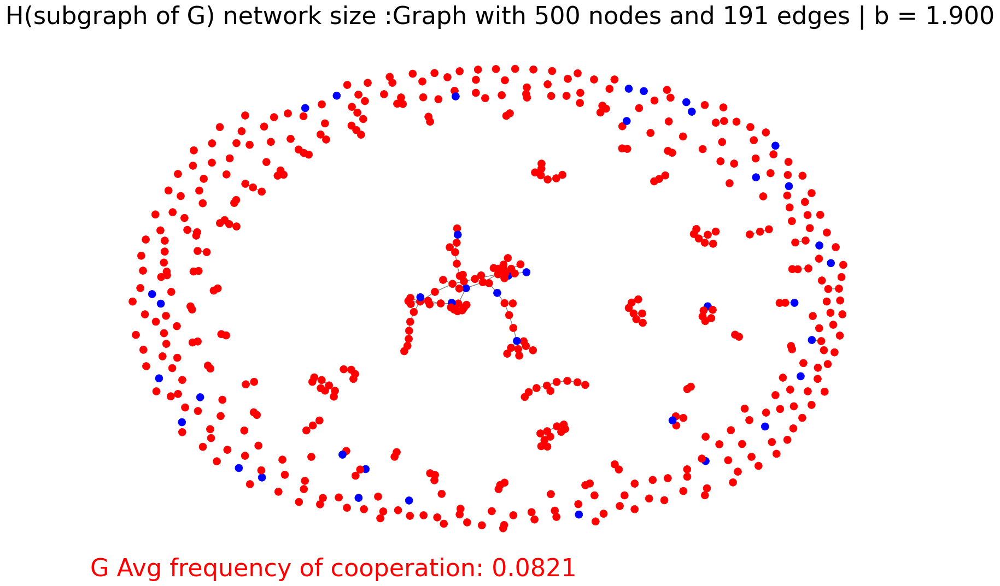

无标度网络大小为Graph with 10000 nodes and 79936 edges, b = 1.950, 达到动态平衡用时 1690.9489784240723 s


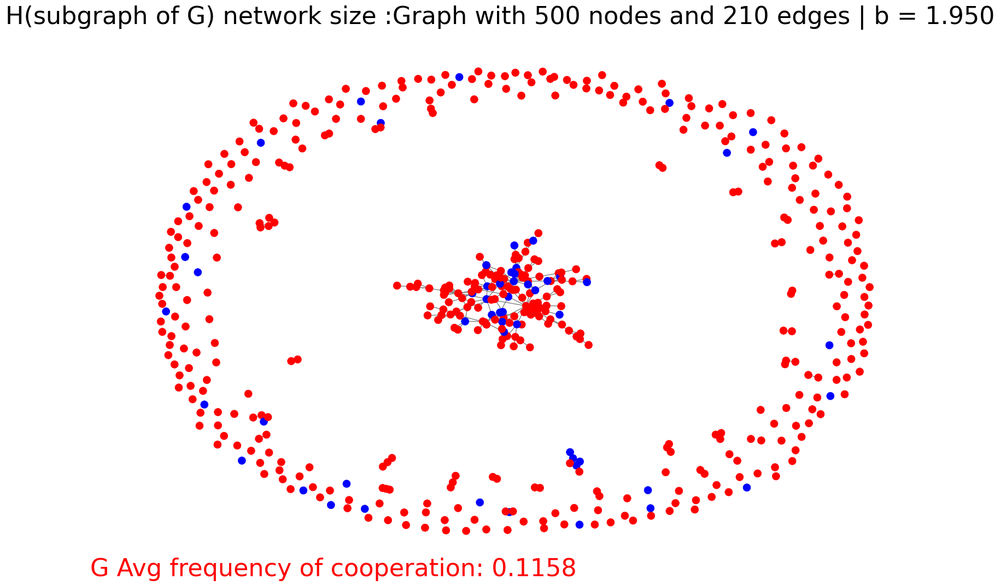

In [2]:
G=Gs[2]

freq_coop_b=[]

for t,b in enumerate(np.array([1.85,1.9,1.95])):

  # 定义博弈函数
  def play_game(x, y):
      if G.nodes[x]['strategy'] == 'C':
          if G.nodes[y]['strategy'] == 'C':
              return R, R
          else:
              return S, b
      else:
          if G.nodes[y]['strategy'] == 'C':
              return b, S
          else:
              return P, P

  D = b - S  # 用于计算策略更新概率的差值

  # 初始化策略，一半为合作者(C)，一半为背叛者(D)
  for i, node in enumerate(G.nodes()):
      G.nodes[i]['strategy'] = 'C' if random.random() < 0.5 else 'D'

  begin = time.time()

  # 进行10000次迭代来达到动态平衡
  for i in range(10000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0.0

      # 每对连接的节点进行一次博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

  print(f"无标度网络大小为{G}, b = {b:.3f}, 达到动态平衡用时 {time.time()-begin} s")

  # 再进行1000次迭代，记录合作者的频率
  p_values = []
  for i in range(1000):
      # 重置所有节点的收益
      for node in G.nodes():
          G.nodes[node]['payoff'] = 0

      # 进行博弈
      for x, y in G.edges():
          px, py = play_game(x, y)
          G.nodes[x]['payoff'] += px
          G.nodes[y]['payoff'] += py

      # 策略更新
      for x in G.nodes():
          y = random.choice(list(G.neighbors(x)))
          if G.nodes[y]['payoff'] > G.nodes[x]['payoff']:
              # 计算策略更新的概率
              update_prob = (G.nodes[y]['payoff'] - G.nodes[x]['payoff']) / (D * max(G.degree(x), G.degree(y)))
              if random.random() < update_prob:
                  G.nodes[x]['strategy'] = G.nodes[y]['strategy']

      # 计算合作者的频率
      p = sum(1 for x in G.nodes() if G.nodes[x]['strategy'] == 'C') / N
      p_values.append(p)

  # 计算1000次迭代的平均合作者频率
  p_avg = sum(p_values) / len(p_values)
  freq_coop_b.append(p_avg)

  # 将节点集转换为列表，然后进行抽样
  selected_nodes = random.sample(list(G.nodes()), 500)

  # 创建这500个节点的子图
  H = G.subgraph(selected_nodes)

  # 为子图中的节点选择颜色
  color_map = {'C': 'blue', 'D': 'red'}
  node_colors = [color_map[H.nodes[node]['strategy']] for node in H.nodes()]
  # 使用 spring_layout 布局
  pos = nx.spring_layout(H)

  # 绘制子图
  plt.figure(figsize=(15, 10))
  nx.draw(H, pos, node_color=node_colors, node_size=100, with_labels=False, edge_color='gray', width=1)
  plt.title(f"H(subgraph of G) network size :{H} | b = {b:.3f}",fontsize=32)
  plt.text(0, 0, f"G Avg frequency of cooperation: {p_avg:.4f}", fontsize=32, color='red',transform=plt.gca().transAxes)
  plt.show()



In [3]:
print("Z=16",freq_coop_b[2])

Z=16 0.11577480000000004


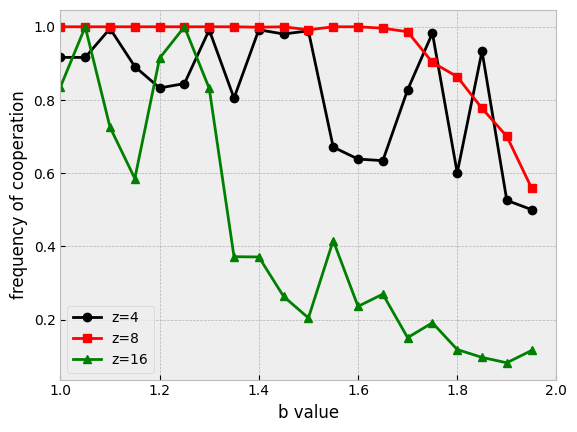

In [6]:
# 假设的数据
b_values = np.arange(1.0,2.0,0.05)  # b的值
# r_values = [0, 0.2, 0.4, 0.6, 0.8, 1.0]  # r的值
freq_coop_b = [0.9164,	0.9163,	0.9951,	0.8913,	0.8329,	0.8448,	0.9915,	0.8051,	0.9918,	0.9803,	0.9888,	0.6713,	0.6386,	0.6343,	0.8277,	0.9827,	0.601,	0.9333,	0.5258,	0.5005]  # 对应b的合作频率
freq_coop_b1 = [1,1, 1,	1	,1	,1	,1,	1	,0.9988	,1,	0.9917,	1	,1	,0.9961,	0.9864	,0.9027	,0.8637	,0.7771	,0.7007	,0.5593]  # 对应b的合作频率
freq_coop_b2 = [0.8356,	1	,0.7257,	0.5854,	0.9143	,1,	0.8318	,0.3719,	0.3712,	0.2633	,0.2046,	0.4161,	0.2362,	0.2696,	0.1508	,0.1914,	0.1183,	0.0968,	0.0821	,0.1158]  # 对应b的合作频率
freq_coop_bs = [freq_coop_b,freq_coop_b1,freq_coop_b2]
# #freq_coop_r = [0.7, 0.72, 0.75, 0.78, 0.8, 0.85]  # 对应r的合作频率

# 绘制b参数对应的合作频率
plt.plot(T, freq_coop_bs[0], 'o-', color='black', label='z=4')
plt.plot(T, freq_coop_bs[1], 's-', color='red', label='z=8')
plt.plot(T, freq_coop_bs[2], '^-', color='green', label='z=16')

# 设置左侧Y轴的刻度范围
# plt.ylim(0.6, 1)

# 设置X轴的刻度范围
plt.xlim(1, 2)

# 设置图表标题和轴标签
plt.xlabel('b value')
plt.ylabel('frequency of cooperation')
plt.legend()
plt.show()